# **Fast Neural Style Transfer**


---

Neural style transfer is the task of combining the artistic style of one image (usually some sort of painting) with the features of a second image. Early approaches like [Gatys et al](https://arxiv.org/abs/1508.06576) were slow because they relied on minimizing a loss for every combination of images given, which could take a lot of steps.
[Johnson et al](https://arxiv.org/abs/1603.08155) presented a different approach where a network is specifically trained to transfer the style features of one image to any other image it is given, which makes the procedure a lot faster. This notebook is an implementation of this paper.

First let's start with some imports

In [ ]:
!pip install tensorflow_addons

     |████████████████████████████████| 706kB 18.2MB/s 


In [ ]:
import tensorflow as tf
import tensorflow_addons as tfa
import numpy as np
import matplotlib.pyplot as plt
import os
import time
import random

from IPython import display
import pathlib

As mentioned, a network (called the transform network) is trained to transfer the style of an image to any other image it is given. I will use Paul Cezanne's 'Bibemus Quarry' (1900).

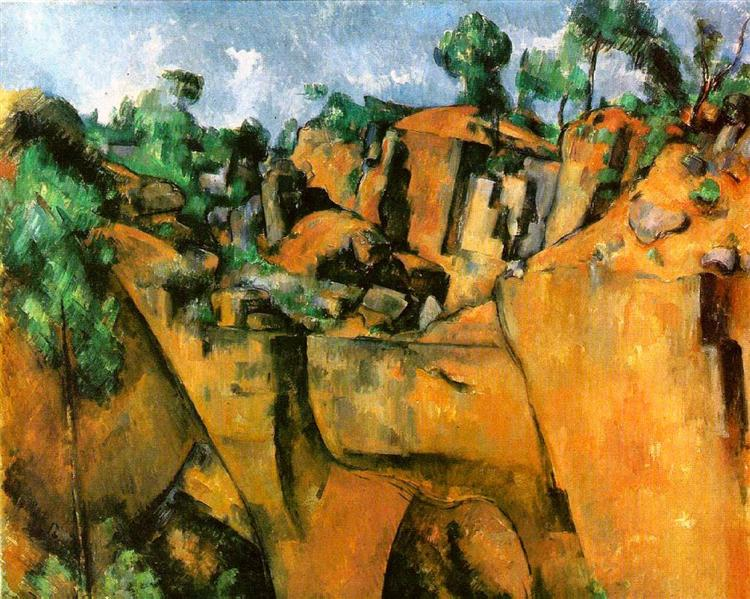

The painting along with a few validation pictures are downloaded and put into a separate folder.

In [ ]:
!mkdir 'images'
!wget -q -O ./images/cezanne.jpg https://uploads7.wikiart.org/images/paul-cezanne/bibemus-quarry.jpg!Large.jpg
!wget -q -O ./images/car.jpg https://www.outsideonline.com/sites/default/files/styles/img_600x600/public/2020/01/14/good-snow_s.jpg?itok=zU1KBuqu
!wget -q -O ./images/dog.jpg https://is2-ssl.mzstatic.com/image/thumb/Purple122/v4/61/4a/ef/614aef00-a490-dd70-8539-397f6525890b/source/256x256bb.jpg
!wget -q -O ./images/acropolis.jpg https://cdn.pixabay.com/photo/2012/11/28/09/51/acropolis-67579_960_720.jpg

The transform network uses a encoder-decoder architecture. It takes an image as input and reconstructs it with the style features added. 

In [ ]:
class ResizeConv2D(tf.keras.layers.Layer):
  def __init__(self, filters, kernel, strides, **kwargs):
    super(ResizeConv2D, self).__init__()
    self.filters = filters
    self.kernel = kernel
    self.strides = strides
    self.conv = tf.keras.layers.Conv2D(self.filters, self.kernel, self.strides, padding='same', use_bias=False, kernel_initializer=initializer)
    self.inst_norm = tfa.layers.InstanceNormalization(axis=-1)
    self.relu = tf.keras.layers.Activation('relu')

  def get_config(self):
    config = super().get_config().copy()
    config.update({'conv':self.conv,
                   'inst':self.inst_norm,
                   'filters':self.filters,
                   'kernel':self.kernel,
                   'strides':self.strides,
                   'relu':self.relu})
    return config

  def call(self, inputs):
    new_h = inputs.shape[1] * self.strides * 2 
    new_w = inputs.shape[2] * self.strides * 2
    x = tf.image.resize(inputs, [new_h, new_w], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    x = self.conv(x)
    x = self.inst_norm(x)
    x = self.relu(x)

    return x

def res_block(inp):

  conv1 = tf.keras.layers.Conv2D(128, (3,3), padding='same', use_bias=False, kernel_initializer=initializer)(inp)
  inst_norm1 = tfa.layers.InstanceNormalization(axis=-1)(conv1)
  relu = tf.keras.layers.ReLU()(inst_norm1)
  conv2 = tf.keras.layers.Conv2D(128, (3,3), padding='same', use_bias=False, kernel_initializer=initializer)(relu)
  inst_norm2 = tfa.layers.InstanceNormalization(axis=-1)(conv2)

  return inst_norm2

def conv_block(inp, filters, strides):

  conv1 = tf.keras.layers.Conv2D(filters=filters, kernel_size=(3,3), strides=strides, padding='same', use_bias=False, kernel_initializer=initializer)(inp)
  inst_norm1 = tfa.layers.InstanceNormalization(axis=-1)(conv1)
  relu = tf.keras.layers.ReLU()(inst_norm1)
  return relu

In [ ]:
initializer = tf.keras.initializers.RandomUniform(seed=0)

In [ ]:
i = tf.keras.Input(shape=(256, 256, 3))

x = tf.keras.layers.Conv2D(32, kernel_size=(9,9), padding='same', use_bias=False, kernel_initializer=initializer)(i)
x = tfa.layers.InstanceNormalization(axis=-1)(x)
x = tf.keras.layers.ReLU()(x)
x = conv_block(x, 64, 2)
x = conv_block(x, 128, 2)

res1 = res_block(x)
skip1 = tf.keras.layers.Add()([res1, x])

res2 = res_block(skip1)
skip2 = tf.keras.layers.Add()([res2, skip1])

res3 = res_block(skip2)
skip3 = tf.keras.layers.Add()([res3, skip2])

res4 = res_block(skip3)
skip4 = tf.keras.layers.Add()([res4, skip3])

res5 = res_block(skip4)
skip5 = tf.keras.layers.Add()([res5, skip4])

res6 = res_block(skip5)
skip6 = tf.keras.layers.Add()([res6, skip5])

res7 = res_block(skip6)
skip7 = tf.keras.layers.Add()([res7, skip6])

res8 = res_block(skip7)
skip8 = tf.keras.layers.Add()([res8, skip7])

x = ResizeConv2D(64, 3, 2)(skip8)
x = ResizeConv2D(32, 3, 2)(x)
x = tf.keras.layers.Conv2D(3, (9, 9), padding='same', use_bias=False, kernel_initializer=initializer)(x)
x = tfa.layers.InstanceNormalization(axis=-1)(x)
x = tf.keras.layers.Activation('tanh')(x)
o = tf.keras.layers.Lambda(lambda x:(x + 1.) * 127.5)(x)

model = tf.keras.Model(inputs=i, outputs=o)

Below is a schematic for the model. It uses convolutional layers for downsampling the input image, each followed by an instance normalization layer (batch normalization was used in the original paper but instance normalization has been shown to perform better) and ReLU activation. After the downsampling the image goes through nine residual blocks (convolutional + instance normalization layers with skip connections). In the original paper, five residual blocks are used but in my experiments nine gave a better result. Finally the image is upsampled back to the original 256x256 resolution using a custom resizing convolutional layer instead of transpose convolutional layer. This type of upsampling has been shwon to reduce checkerboard artifacts on the final image and improve image quality (see [this](https://distill.pub/2016/deconv-checkerboard/) article for a great explanation).
The last layer has Tanh activation function scaled to (0,255) which we'll be important for the next step.

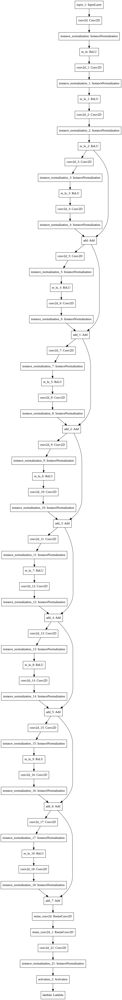

In [ ]:
tf.keras.utils.plot_model(model)

In order to train the network to produce stylized images we will need to use an appropriate loss. This loss is going to be the sum of two terms: a style loss and a content loss. The style loss is going to account for the similarity of the output image with the style image and the content loss will account for the similarity with the input image. We will encode these similarities by extracting the features of the final image and comparing them to the features of the style and the original image.

For this extraction we will use pretrained layers from a VGG19 network trained on the ImageNet dataset:

In [ ]:
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1',
                'block4_conv2',
                'block5_conv2']

content_layers = ['block5_conv2']

output_layers = style_layers + content_layers

def vgg_model(layers):
  
  vgg = tf.keras.applications.vgg19.VGG19(include_top=False, weights='imagenet')

  vgg.trainable = False

  outputs = [vgg.get_layer(name).output for name in layers]

  model = tf.keras.Model(inputs=[vgg.inputs], outputs=outputs)

  return model

vgg = vgg_model(output_layers)

80142336/80134624 [==============================] - 1s 0us/step


The choice of layers for extraction can vary but, as a general rule of thumb, shallower layers are chosen for extracting style features while layers that are closer to the top are used to extract features from the input image.

Images fed into an ImageNet-trained VGG199 need a specific preprocessing which is taken care of with a function defined below. A function for loading images is also defined.

In [ ]:
def load_img(path):
  image = tf.io.read_file(path)
  image = tf.image.decode_jpeg(image)
  image = tf.image.convert_image_dtype(image, tf.float32)
  return image

def preprocess_image(image):
  image = tf.cast(image, dtype=tf.float32)
  image = tf.keras.applications.vgg19.preprocess_input(image)
  return image

## Constructing the loss

The functions below are used to extract content features from the input and output (generated) images

In [ ]:
def get_content_image_feature(content_image):

  preprocessed_content_image = preprocess_image(content_image)
    
  outputs = vgg(preprocessed_content_image) 

  content_outputs = outputs[5]

  return content_outputs

def get_content_generated_image_feature(generated_image):

  preprocessed_generated_image = preprocess_image(generated_image)
    
  outputs = vgg(preprocessed_generated_image) 

  generated_outputs = outputs[5]

  return generated_outputs

The content loss is going to be proportional to the squared difference of these two sets of features.

For the style loss we will need to define a mathematical object called the [Gram matrix](https://en.wikipedia.org/wiki/Gram_matrix). This matrix is commonly used to represent the loss in style transfer tasks because it essentialy represents the covariance between pixels in the image.

In [ ]:
def gram(input_tensor): 

  input_shape = tf.shape(input_tensor)
  batch_size = input_shape[0]
  height = input_shape[1]
  width = input_shape[2]
  channels = input_shape[3]

  tensor = tf.reshape(input_tensor, (batch_size, height*width, channels))
  t_tensor = tf.transpose(tensor, perm=[0,2,1])
  gram = tf.matmul(t_tensor, tensor)

  scaling_factor = tf.cast(height * width * channels, tf.float32)

  scaled_gram = gram / scaling_factor
  return scaled_gram

Similarly to the content loss the style loss is going to be proportional to the squared difference of the style features extracted from the style image and the generated image

In [ ]:
def get_style_image_features(style_image):

  preprocessed_style_image = preprocess_image(style_image)

  outputs = vgg(preprocessed_style_image)

  style_outputs = outputs[:5]

  gram_style_features = [gram(style_layer) for style_layer in style_outputs]

  return gram_style_features

def get_generated_image_style_features(generated_image):

  preprocessed_generated_image = preprocess_image(generated_image)

  outputs = vgg(preprocessed_generated_image)

  generated_outputs = outputs[:5]

  gram_generated_features = [gram(generated_layer) for generated_layer in generated_outputs]

  return gram_generated_features

Additionally to the content and style loss the authors use a thirmd term called the total variation loss. This loss pushes the network to produce a smoother image by penalizing high differeneces in values of adjacent pixels.

In [ ]:
def total_variation_loss(img):
    x_var = img[:,:,1:,:] - img[:,:,:-1,:]
    y_var = img[:,1:,:,:] - img[:,:-1,:,:]
    return tf.reduce_mean(tf.square(x_var)) + tf.reduce_mean(tf.square(y_var))

The function below puts it all together:

In [ ]:
def get_total_loss(style_inputs, generated_inputs, content_inputs,
                   style_weight, content_weight, tv_weight):

  gram_style_features = get_style_image_features(style_inputs)
  gram_generated_features = get_generated_image_style_features(generated_inputs)

  style_l = tf.add_n([tf.reduce_mean(tf.square(gg_feature - gs_feature))
                      for gg_feature, gs_feature in zip(gram_generated_features, gram_style_features)])
  
  content_image_feature = get_content_image_feature(content_inputs)
  generated_image_feature = get_content_generated_image_feature(generated_inputs)

  feature_l = tf.add_n([tf.reduce_mean(tf.square(generated_image_feature - content_image_feature))])
  
  var_l = total_variation_loss(generated_inputs)
  
  total_style_loss = style_l * style_weight / 5
  total_feature_loss = feature_l * content_weight
  total_var_loss = var_l * tv_weight

  total_loss = total_style_loss + total_feature_loss + total_var_loss

  return total_loss, style_l, feature_l, var_l

The three loss terms are going to be weighted with values that will be determined through experimentation.

## Dataset

In the original paper the transform network is rained on the COCO dataset with images scaled to 256x256. I chose a smaller dataset, namely the [Places365](http://places2.csail.mit.edu/download.html) validation dataset which contains 36500 images.

In [ ]:
URL = 'http://data.csail.mit.edu/places/places365/val_256.tar'

path_to_zip = tf.keras.utils.get_file('val_256.tar',
                                      origin=URL,
                                      extract=True)

525164544/525158400 [==============================] - 48s 0us/step


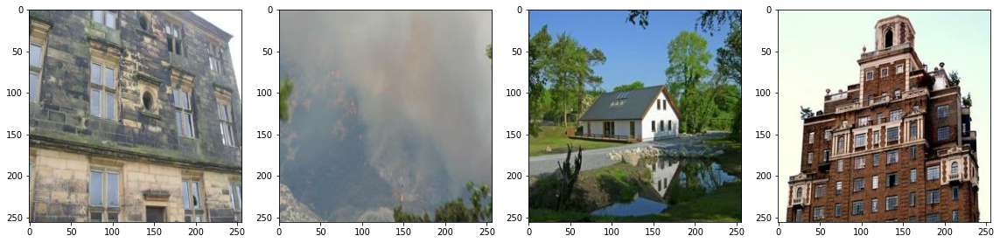

In [ ]:
PATH = '/root/.keras/datasets/val_256/'

plt.figure(figsize=(16,4))
for i in range(4):
  plt.subplot(1,4,i+1)
  plt.imshow(load_img(PATH+os.listdir(PATH)[random.randint(0,36499)]))

plt.tight_layout()
plt.show()


The dataset contains 256x256 images of various places used for scene classification.

## Training step

Below we define the training step taken after each batch.

In [ ]:
def train_step(input_image, g_batch, style_image, style_weight, content_weight, tv_weight):


  with tf.GradientTape() as tape:

    image = model(g_batch, training=True)
    
    total_loss, style_l, feature_l, var_l = get_total_loss(style_inputs=style_image, generated_inputs=image, content_inputs=input_image,
                            style_weight=style_weight, content_weight=content_weight, tv_weight=tv_weight)
    

  grads = tape.gradient(total_loss, model.trainable_variables)
  optimizer.apply_gradients(zip(grads, model.trainable_variables))

  return total_loss, image, style_l, feature_l, var_l

The 'g_batch' variable is a numpy array which is used as placeholder. At each iteration a batch of four images is copied into the numpy array which is then passed through the network. The features are then extracted and the total loss and gradients calculated. After that the weights are updated accordingly.

We will use the Adam optimizer with its default 0.001 learning rate.

In [ ]:
optimizer = tf.keras.optimizers.Adam()

## Input pipeline

Below we define a few functions for preprocessing the inputs. From my experimentation I have found that normalizing the inputs that are fed to the transform network doesn't result in any kind of performance boost (in fact the network doesn't seem to converge at all).

In [ ]:
data_dir = pathlib.Path(PATH)

list_ds = tf.data.Dataset.list_files(str(data_dir/'*'))

def decode_img(img):
    img = tf.image.decode_jpeg(img, channels=3)
    return tf.cast(img, tf.float32)

def process_path_for_ds(file_path):
    img = tf.io.read_file(file_path)
    img = decode_img(img)
    return img

def load_style_image(file_path):
    img = tf.io.read_file(file_path)
    img = tf.image.decode_jpeg(img, channels=3)
    
    r = img.shape[0] / img.shape[1]
    if r < 1:
        img = tf.image.resize(img, [256, int(256/r)], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    else:
        img = tf.image.resize(img, [int(256/r), 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    
    img = tf.image.random_crop(img, [256, 256, 3])
    img = img[tf.newaxis, :]
    img = tf.image.convert_image_dtype(img, tf.uint8)
    return img

Regarding the `load_style_image` function, I have found that for optimal style transfer it is best to scale the small dimension of the style image down to 256 pixels and the large dimension to 256 multiplied by the aspect ratio and then randomly crop a 256x256 patch to be used for style extraction.

In [ ]:
ds = list_ds.map(process_path_for_ds).batch(4).shuffle(1024).prefetch(tf.data.experimental.AUTOTUNE)

In [ ]:
style_image = load_style_image('/content/images/cezanne.jpg')

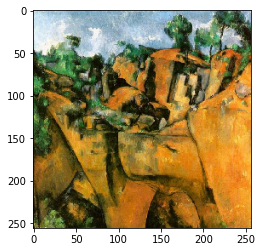

In [ ]:
plt.imshow(tf.squeeze(style_image))

In [ ]:
model.load_weights('/content/cezanne_20210306_.h5')

## Training loop

Finally we define the training loop and perform the training for a single epoch (approximately 9000 iterations). The weights are going to be saved every 200 iterations and a generated image is going to be displayed every 10 iterations for inspection of the progress made.

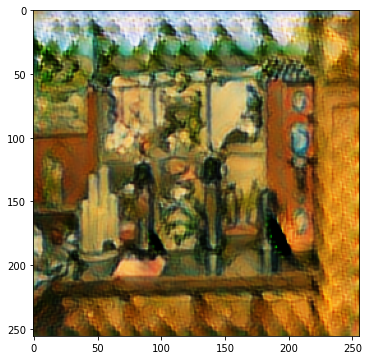

total loss at step 9119: 10716.40

style loss at step 9119: 13834.556640625

feature loss at step 9119: 2944.638671875

variation loss at step 9119: 587.893310546875



In [ ]:
EPOCHS = 1

style_weight = 1
content_weight = 2.5
tv_weight = 1


g_batch = np.zeros((4, 256, 256, 3), dtype=np.float32)

tot_loss = []
st_l = []
f_l = []
tv_l = []

for epoch in range(EPOCHS):
    print('\nEpoch', epoch)

    it = 0 
    for step, img in enumerate(ds):

        for j, img_p in enumerate(img):
            g_batch[j] = img_p
        
        total_loss, image, style_l, feature_l, var_l = train_step(img, g_batch, style_image, style_weight, content_weight, tv_weight)
        
        it += 1 

        if it%200 == 0:
            model.save_weights('./cezanne.h5')
            print('weights saved')

    
    
    
        if it%10==0:
            display.clear_output(wait=True)
            plt.figure(figsize=(6,6))
            plt.imshow(tf.cast(image[0,:, :, :], tf.uint32))

            plt.show()

   
            print('total loss at step {}: {:0.2f}\n'.format(step,total_loss))
            print('style loss at step {}: {}\n'.format(step,style_l))
            print('feature loss at step {}: {}\n'.format(step,feature_l))
            print('variation loss at step {}: {}\n'.format(step,var_l))

            tot_loss.append(tf.squeeze(total_loss))
            st_l.append(tf.squeeze(style_l))
            f_l.append(tf.squeeze(feature_l))
            tv_l.append(tf.squeeze(var_l))

After around two hours of training we reach a a result. First let's visualize the losses.

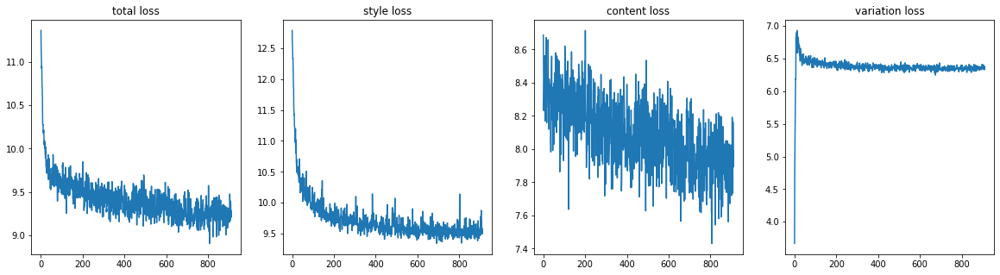

In [ ]:
plt.figure(figsize=(20,5))
plt.subplot(1,4,1)
plt.title('total loss')
plt.plot(np.log(tot_loss))
plt.subplot(1,4,2)
plt.title('style loss')
plt.plot(np.log(st_l))
plt.subplot(1,4,3)
plt.title('content loss')
plt.plot(np.log(f_l))
plt.subplot(1,4,4)
plt.title('variation loss')
plt.plot(np.log(tv_l))

The style and variation losses look like they have reached their minimum, but the content loss hasn't. This is not necessarily bad. In my experiments I observed that training for longer times often leads to output images that lack style features and are more close to the original input images.

In [ ]:
def load_model_img(path, model=False):
  image = tf.io.read_file(path)
  image = tf.image.decode_jpeg(image)
  image = tf.image.convert_image_dtype(image, tf.float32)
  if model==True:
    image = tf.expand_dims(image, 0)
  return image


Before we visualize our results let se how much time it takes for our model to make an inference.

In [ ]:
start = time.time()
ex = model(load_model_img(PATH+os.listdir(PATH)[rand],True), training=False)
print(time.time()-start)

0.07407546043395996


It takes 0.07 seconds including loading the image. For reference Gatys et al method takes over a minute for each iteration of optimization.

Lets' also visualize some images

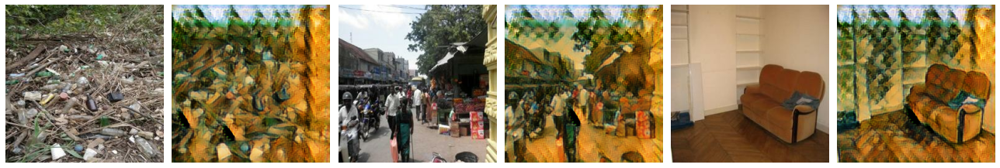

In [ ]:
rand1 = random.randint(0,36499)
rand2 = random.randint(0,36499)
rand3 = random.randint(0,36499)

example1 = load_img(PATH+os.listdir(PATH)[rand1])
example2 = load_img(PATH+os.listdir(PATH)[rand2])
example3 = load_img(PATH+os.listdir(PATH)[rand3])

example_style1 = model(load_model_img(PATH+os.listdir(PATH)[rand1], model=True), training=False)
example_style2 = model(load_model_img(PATH+os.listdir(PATH)[rand2], model=True), training=False)
example_style3 = model(load_model_img(PATH+os.listdir(PATH)[rand3], model=True), training=False)

plt.figure(figsize=(18,6))
plt.subplot(1,6,1)
plt.imshow(example1)
plt.axis('off')
plt.subplot(1,6,2)
plt.imshow(tf.cast(tf.squeeze(example_style1), tf.uint8))
plt.axis('off')
plt.subplot(1,6,3)
plt.imshow(example2)
plt.axis('off')
plt.subplot(1,6,4)
plt.imshow(tf.cast(tf.squeeze(example_style2), tf.uint8))
plt.axis('off')
plt.subplot(1,6,5)
plt.imshow(example3)
plt.axis('off')
plt.subplot(1,6,6)
plt.imshow(tf.cast(tf.squeeze(example_style3), tf.uint8))
plt.axis('off')
plt.tight_layout()
plt.show()

The model has done a decent job transfering the style of the painting to other images. One of the things I observed with experimentation is that style images that contain features with well defined outlines produce better images overall. 

For instance I have previously trained the network on Picasso's [the Muse](https://uploads5.wikiart.org/images/pablo-picasso/a-muse-1935.jpg!Large.jpg) (1935)


In [ ]:
!gdown --id 1_w3rICOWcH-6L_x0ttJvTRNGfRlGzfap

Downloading...
From: https://drive.google.com/uc?id=1_w3rICOWcH-6L_x0ttJvTRNGfRlGzfap
To: /content/muse_20210303.h5
10.4MB [00:00, 48.7MB/s]


In [ ]:
muse = tf.keras.models.clone_model(model)
muse.load_weights('/content/muse_20210303.h5')

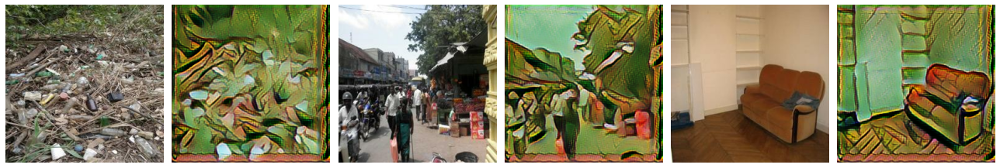

In [ ]:
muse1 =  muse(load_model_img(PATH+os.listdir(PATH)[rand1], model=True), training=False)
muse2 =  muse(load_model_img(PATH+os.listdir(PATH)[rand2], model=True), training=False)
muse3 =  muse(load_model_img(PATH+os.listdir(PATH)[rand3], model=True), training=False)

plt.figure(figsize=(18,6))
plt.subplot(1,6,1)
plt.imshow(example1)
plt.axis('off')
plt.subplot(1,6,2)
plt.imshow(tf.cast(tf.squeeze(muse1), tf.uint8))
plt.axis('off')
plt.subplot(1,6,3)
plt.imshow(example2)
plt.axis('off')
plt.subplot(1,6,4)
plt.imshow(tf.cast(tf.squeeze(muse2), tf.uint8))
plt.axis('off')
plt.subplot(1,6,5)
plt.imshow(example3)
plt.axis('off')
plt.subplot(1,6,6)
plt.imshow(tf.cast(tf.squeeze(muse3), tf.uint8))
plt.axis('off')
plt.tight_layout()
plt.show()

It is also interesting to observe the effect of training the model on a smaller patch of the style image. Below are the results of training on just the middle part of the original Cezanne painting.

In [ ]:
!gdown --id 1I7-IOWaLr1kqan_ElBMCZzonxHCrMA0a

Downloading...
From: https://drive.google.com/uc?id=1I7-IOWaLr1kqan_ElBMCZzonxHCrMA0a
To: /content/cezanne_20210303.h5
10.4MB [00:00, 48.7MB/s]


In [ ]:
cezanne = tf.keras.models.clone_model(model)
cezanne.load_weights('/content/cezanne_20210303.h5')

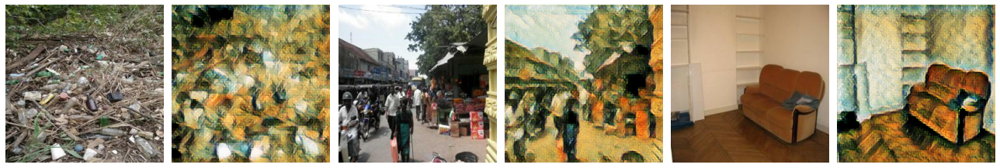

In [ ]:
cezanne1 =  cezanne(load_model_img(PATH+os.listdir(PATH)[rand1], model=True), training=False)
cezanne2 =  cezanne(load_model_img(PATH+os.listdir(PATH)[rand2], model=True), training=False)
cezanne3 =  cezanne(load_model_img(PATH+os.listdir(PATH)[rand3], model=True), training=False)

plt.figure(figsize=(18,6))
plt.subplot(1,6,1)
plt.imshow(example1)
plt.axis('off')
plt.subplot(1,6,2)
plt.imshow(tf.cast(tf.squeeze(cezanne1), tf.uint8))
plt.axis('off')
plt.subplot(1,6,3)
plt.imshow(example2)
plt.axis('off')
plt.subplot(1,6,4)
plt.imshow(tf.cast(tf.squeeze(cezanne2), tf.uint8))
plt.axis('off')
plt.subplot(1,6,5)
plt.imshow(example3)
plt.axis('off')
plt.subplot(1,6,6)
plt.imshow(tf.cast(tf.squeeze(cezanne3), tf.uint8))
plt.axis('off')
plt.tight_layout()
plt.show()

This was also trained for fewer iterations and is arguably more aestheticaly pleasing than our final results.

The weights of all my experiments are in this Google Drive [folder](https://drive.google.com/drive/folders/1bFVw0RijqhDZAvck2ASbkdima2aAT1Dn?usp=sharing)

Below are some of the results.

In [ ]:
!gdown --id 1PXi33cG-cCezN55qEw3fV24hgXiufju-

Downloading...
From: https://drive.google.com/uc?id=1PXi33cG-cCezN55qEw3fV24hgXiufju-
To: /content/wave_20210304.h5
10.4MB [00:00, 39.4MB/s]


In [ ]:
wave = tf.keras.models.clone_model(model)
wave.load_weights('wave_20210304.h5')

Trained on [*The Wave*](https://upload.wikimedia.org/wikipedia/commons/thumb/a/a5/Tsunami_by_hokusai_19th_century.jpg/1280px-Tsunami_by_hokusai_19th_century.jpg) by Hokusai

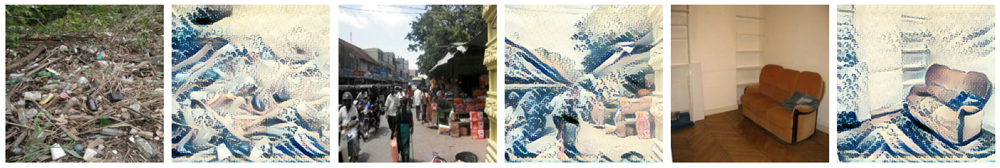

In [ ]:
wave1 =  wave(load_model_img(PATH+os.listdir(PATH)[rand1], model=True), training=False)
wave2 =  wave(load_model_img(PATH+os.listdir(PATH)[rand2], model=True), training=False)
wave3 =  wave(load_model_img(PATH+os.listdir(PATH)[rand3], model=True), training=False)

plt.figure(figsize=(18,6))
plt.subplot(1,6,1)
plt.imshow(example1)
plt.axis('off')
plt.subplot(1,6,2)
plt.imshow(tf.cast(tf.squeeze(wave1), tf.uint8))
plt.axis('off')
plt.subplot(1,6,3)
plt.imshow(example2)
plt.axis('off')
plt.subplot(1,6,4)
plt.imshow(tf.cast(tf.squeeze(wave2), tf.uint8))
plt.axis('off')
plt.subplot(1,6,5)
plt.imshow(example3)
plt.axis('off')
plt.subplot(1,6,6)
plt.imshow(tf.cast(tf.squeeze(wave3), tf.uint8))
plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
!gdown --id 1Axvuv8Ere7FBU6RDIAzVhYrXCTwwBuS_

Downloading...
From: https://drive.google.com/uc?id=1Axvuv8Ere7FBU6RDIAzVhYrXCTwwBuS_
To: /content/kandinsky_20210304.h5
10.4MB [00:00, 39.4MB/s]


In [ ]:
kandinsky = tf.keras.models.clone_model(model)
kandinsky.load_weights('kandinsky_20210304.h5')

Trained on [*Composition VII*](https://uploads0.wikiart.org/images/wassily-kandinsky/composition-vii-1913.jpg!Large.jpg) (1913) by Wassily Kandinsky 

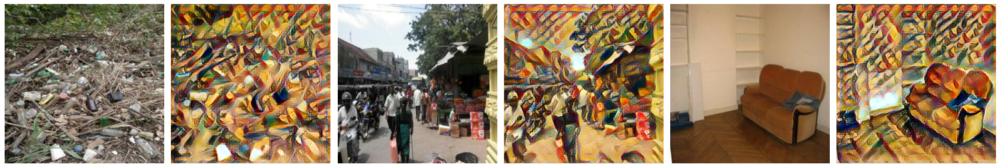

In [ ]:
kandinsky1 =  kandinsky(load_model_img(PATH+os.listdir(PATH)[rand1], model=True), training=False)
kandinsky2 =  kandinsky(load_model_img(PATH+os.listdir(PATH)[rand2], model=True), training=False)
kandinsky3 =  kandinsky(load_model_img(PATH+os.listdir(PATH)[rand3], model=True), training=False)

plt.figure(figsize=(18,6))
plt.subplot(1,6,1)
plt.imshow(example1)
plt.axis('off')
plt.subplot(1,6,2)
plt.imshow(tf.cast(tf.squeeze(kandinsky1), tf.uint8))
plt.axis('off')
plt.subplot(1,6,3)
plt.imshow(example2)
plt.axis('off')
plt.subplot(1,6,4)
plt.imshow(tf.cast(tf.squeeze(kandinsky2), tf.uint8))
plt.axis('off')
plt.subplot(1,6,5)
plt.imshow(example3)
plt.axis('off')
plt.subplot(1,6,6)
plt.imshow(tf.cast(tf.squeeze(kandinsky3), tf.uint8))
plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
!gdown --id 14jw9ao-4ftzhrySoefJ_cwLMG0zg9-4z

Downloading...
From: https://drive.google.com/uc?id=14jw9ao-4ftzhrySoefJ_cwLMG0zg9-4z
To: /content/wheeler_20210303_.h5
10.4MB [00:00, 39.5MB/s]


In [ ]:
wheeler = tf.keras.models.clone_model(model)
wheeler.load_weights('wheeler_20210303_.h5')

Trained on [*Man menacing woman*](https://uploads8.wikiart.org/images/steve-wheeler/man-menacing-woman-1943.jpg!Large.jpg) (1943) by Steve Wheeler

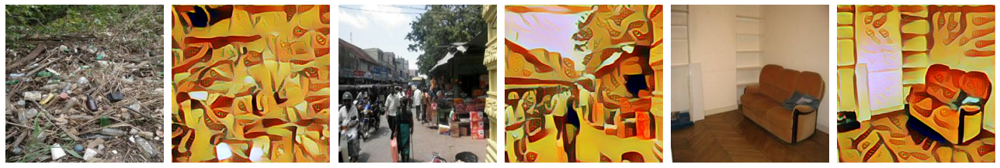

In [ ]:
wheeler1 =  wheeler(load_model_img(PATH+os.listdir(PATH)[rand1], model=True), training=False)
wheeler2 =  wheeler(load_model_img(PATH+os.listdir(PATH)[rand2], model=True), training=False)
wheeler3 =  wheeler(load_model_img(PATH+os.listdir(PATH)[rand3], model=True), training=False)

plt.figure(figsize=(18,6))
plt.subplot(1,6,1)
plt.imshow(example1)
plt.axis('off')
plt.subplot(1,6,2)
plt.imshow(tf.cast(tf.squeeze(wheeler1), tf.uint8))
plt.axis('off')
plt.subplot(1,6,3)
plt.imshow(example2)
plt.axis('off')
plt.subplot(1,6,4)
plt.imshow(tf.cast(tf.squeeze(wheeler2), tf.uint8))
plt.axis('off')
plt.subplot(1,6,5)
plt.imshow(example3)
plt.axis('off')
plt.subplot(1,6,6)
plt.imshow(tf.cast(tf.squeeze(wheeler3), tf.uint8))
plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
!gdown --id 1Dr8VcQq-BaGD6DJBc4cD_FFQllrMrcQR

Downloading...
From: https://drive.google.com/uc?id=1Dr8VcQq-BaGD6DJBc4cD_FFQllrMrcQR
To: /content/davis_20210304_.h5
10.4MB [00:00, 48.7MB/s]


In [ ]:
davis = tf.keras.models.clone_model(model)
davis.load_weights('davis_20210304_.h5')

Trained on [*Hot Still-Scape for Six Colors*](https://uploads8.wikiart.org/images/stuart-davis/hot-still-scape-for-six-colors-7th-avenue-style-1940.jpg) (1940) by Stuart Davis

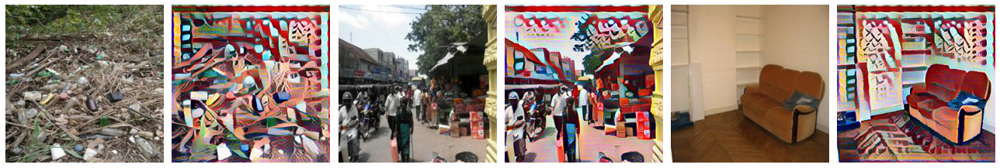

In [ ]:
davis1 =  davis(load_model_img(PATH+os.listdir(PATH)[rand1], model=True), training=False)
davis2 =  davis(load_model_img(PATH+os.listdir(PATH)[rand2], model=True), training=False)
davis3 =  davis(load_model_img(PATH+os.listdir(PATH)[rand3], model=True), training=False)

plt.figure(figsize=(18,6))
plt.subplot(1,6,1)
plt.imshow(example1)
plt.axis('off')
plt.subplot(1,6,2)
plt.imshow(tf.cast(tf.squeeze(davis1), tf.uint8))
plt.axis('off')
plt.subplot(1,6,3)
plt.imshow(example2)
plt.axis('off')
plt.subplot(1,6,4)
plt.imshow(tf.cast(tf.squeeze(davis2), tf.uint8))
plt.axis('off')
plt.subplot(1,6,5)
plt.imshow(example3)
plt.axis('off')
plt.subplot(1,6,6)
plt.imshow(tf.cast(tf.squeeze(davis3), tf.uint8))
plt.axis('off')
plt.tight_layout()
plt.show()

Let's try our styles on an image that is not 256x256

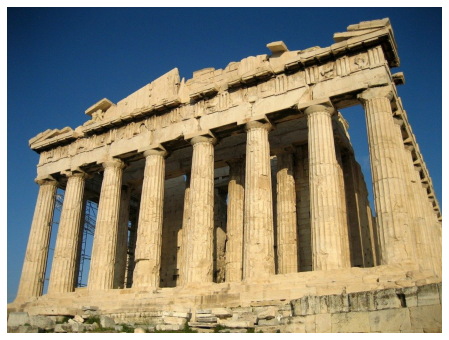

In [ ]:
acr = load_model_img('/content/images/acropolis.jpg')

plt.figure(figsize=(12,6))
plt.imshow(acr)
plt.axis('off')
plt.show()

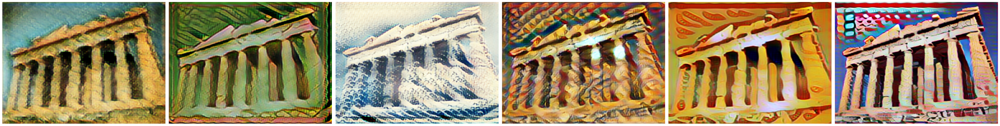

In [ ]:
acr_h = acr.shape[0]
acr_w = acr.shape[1]


acr_style1 = tf.image.resize(tf.squeeze(cezanne(tf.image.resize(load_model_img('/content/images/acropolis.jpg',True), size=[256,256]), training=False)), size=[acr_h, acr_w])
acr_style2 = tf.image.resize(tf.squeeze(muse(tf.image.resize(load_model_img('/content/images/acropolis.jpg',True), size=[256,256]), training=False)), size=[acr_h, acr_w])
acr_style3 = tf.image.resize(tf.squeeze(wave(tf.image.resize(load_model_img('/content/images/acropolis.jpg',True), size=[256,256]), training=False)), size=[acr_h, acr_w])
acr_style4 = tf.image.resize(tf.squeeze(kandinsky(tf.image.resize(load_model_img('/content/images/acropolis.jpg',True), size=[256,256]), training=False)), size=[acr_h, acr_w])
acr_style5 = tf.image.resize(tf.squeeze(wheeler(tf.image.resize(load_model_img('/content/images/acropolis.jpg',True), size=[256,256]), training=False)), size=[acr_h, acr_w])
acr_style6 = tf.image.resize(tf.squeeze(davis(tf.image.resize(load_model_img('/content/images/acropolis.jpg',True), size=[256,256]), training=False)), size=[acr_h, acr_w])

plt.figure(figsize=(42,7))
plt.subplot(1,6,1)
plt.imshow(tf.cast(acr_style1, tf.uint8))
plt.axis('off')
plt.subplot(1,6,2)
plt.imshow(tf.cast(acr_style2, tf.uint8))
plt.axis('off')
plt.subplot(1,6,3)
plt.imshow(tf.cast(acr_style3, tf.uint8))
plt.axis('off')
plt.subplot(1,6,4)
plt.imshow(tf.cast(acr_style4, tf.uint8))
plt.axis('off')
plt.subplot(1,6,5)
plt.imshow(tf.cast(acr_style5, tf.uint8))
plt.axis('off')
plt.subplot(1,6,6)
plt.imshow(tf.cast(acr_style6, tf.uint8))
plt.axis('off')
plt.tight_layout()
plt.show()

## Conclusions

We demonstrated how to perform fast neural style transfer and saw that certain images work better than others for this task. We also saw that there can be flexibility on the choice of images for style transfer.

Although this method is considerably faster, its main drawback is that the transform network has to be trained on a single style image. Newer approach like [Arbitrary Style Transfer](https://arxiv.org/abs/1703.06868) can take any style input and transfer it to any other image. We will explore such methods in the future.